In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import os
import numpy as np
import logging
snscolors = sns.color_palette("colorblind")
from copy import deepcopy
import pandas as pd
from chainconsumer import Chain, ChainConsumer, make_sample, Truth, ChainConfig, PlotConfig

In [2]:
def make_triangle_plot(
    fishers=None,
    chains=None,
    fisher_labels=None,
    chain_labels=None,
    params=None,
    colors=None,
    truth_values=None,
    shade_fisher=False,
    shade_chains=True,
    fontsize=16,
    param_labels=None,
):
    """Create a triangle plot from Fisher matrices and/or MCMC chains using ChainConsumer.

    Parameters
    ----------
    fishers : list, optional
        List of Fisher matrix objects with attributes param_fiducial, fisher_matrix_inv, param_names
    chains : list, optional
        List of pandas DataFrames containing MCMC chains with 'weight' column
    fisher_labels : list, optional
        Labels for Fisher matrices in the plot legend
    chain_labels : list, optional
        Labels for MCMC chains in the plot legend
    params : list, optional
        Parameters to plot. If None, uses all parameters from first Fisher/chain
    colors : list, optional
        Colors for each Fisher/chain. Defaults to a preset color scheme
    truth_values : dict, optional
        Dictionary of true parameter values to plot as vertical lines
    shade_fisher : bool or list, optional
        Whether to shade Fisher contours. Can be single bool or list for each Fisher
    shade_chains : bool or list, optional
        Whether to shade chain contours. Can be single bool or list for each chain
    fontsize : int, optional
        Font size for legend and labels
    param_labels : dict, optional
        Dictionary mapping parameter names to LaTeX labels. Default provides common cosmological parameters

    Returns
    -------
    matplotlib.figure.Figure
        The generated triangle plot

    Examples
    --------
    >>> # Plot just Fisher matrices
    >>> fig = make_triangle_plot(
    ...     fishers=[fisher1, fisher2],
    ...     fisher_labels=['SKAO', 'Euclid']
    ... )

    >>> # Plot Fisher matrices and chains
    >>> fig = make_triangle_plot(
    ...     fishers=[fisher1],
    ...     chains=[chain_df],
    ...     fisher_labels=['Fisher'],
    ...     chain_labels=['MCMC'],
    ...     truth_values={'Omegam': 0.3, 'h': 0.7}
    ... )
    """
    # Initialize ChainConsumer
    c = ChainConsumer()

    # Default colors
    default_colors = ['#3a86ff', '#fb5607', '#8338ec', '#ffbe0b', '#d11149']
    if colors is None:
        colors = default_colors

    # Default parameter labels
    default_param_labels = {
        'Omegam': r'$\Omega_{{\rm m}, 0}$',
        'Omegab': r'$\Omega_{{\rm b}, 0}$',
        'h': r'$h$',
        'ns': r'$n_{\rm s}$',
        'sigma8': r'$\sigma_8$',
        'bI_c1': r'$bI_{{\rm c}, 1}$',
        'bI_c2': r'$bI_{{\rm c}, 2}$'
    }
    if param_labels is None:
        param_labels = default_param_labels

    # Process Fisher matrices
    if fishers is not None:
        if fisher_labels is None:
            fisher_labels = [f'Fisher {i+1}' for i in range(len(fishers))]
        
        # Convert shade_fisher to list if needed
        if isinstance(shade_fisher, bool):
            shade_fisher = [shade_fisher] * len(fishers)

        for i, fisher in enumerate(fishers):
            fishchain = Chain.from_covariance(
                mean=fisher.param_fiducial,
                covariance=fisher.fisher_matrix_inv,
                columns=fisher.param_names,
                color=colors[i],
                shade=shade_fisher[i],
                name=fisher_labels[i]
            )
            c.add_chain(fishchain)

    # Process MCMC chains
    if chains is not None:
        if chain_labels is None:
            chain_labels = [f'Chain {i+1}' for i in range(len(chains))]
        
        # Convert shade_chains to list if needed
        if isinstance(shade_chains, bool):
            shade_chains = [shade_chains] * len(chains)

        start_color = len(fishers) if fishers is not None else 0
        for j, chain in enumerate(chains):
            chain_nonzero = chain[chain['weight'] > 0]
            c.add_chain(
                Chain(
                    samples=chain_nonzero,
                    name=chain_labels[j],
                    color=colors[start_color + j],
                    shade=shade_chains[j]
                )
            )

    # Add truth values if provided
    if truth_values is not None:
        c.add_truth(Truth(location=truth_values))

    # Configure plot settings
    c.set_plot_config(
        PlotConfig(
            sigma2d=False,
            summary=True,
            plot_point=True,
            legend_kwargs={"fontsize": fontsize},
            labels=param_labels
        )
    )

    # Create and return the plot
    fig = c.plotter.plot(columns=params)
    return fig

In [3]:
maindir = './oneloopchains_yesBBN'

In [4]:
pbj_chain = np.load(maindir + '/AndreaChiara/chain_nautilus_EFT_hMpc_z1.0_1.2_1.4_1.65_w0waCDM_nosyst_DR3_kmax_2_15_15_25_2_2_25_2_2_3_25_25_U_wc_ns_h_As_w0_wa_b1_b2_bG2_N_wb_AM_bGam3_c0t_c2t_c4t_cnlo_NP0_eps0_eps2_w0+wa_leq_-0.33.npy')

In [5]:
pbj_chain.shape

(15900, 21)

In [6]:
pbj_truth_values_raw = {
    'wc': 0.121203,
    'wb': 0.0219961,
    'ns': 0.96,
    'h': 0.67,
    'As': 2.1,
    'w0': -1.0,
    'wa': 0.0,
    'b1': [1.412, 1.769, 2.039, 2.496],
    'b2': [0.695, 0.870, 1.162, 2.010],
    'bG2': [-0.156, -0.299, -0.400, -0.555],
    'bGam3': [0.323, 0.621, 0.827, 1.137],
    'c0t': [11.602875, 14.474875, 15.666125, 26.412625],
    'c2t': [36.00720140613579, 44.93550196893367, 43.83654751052021, 62.36900114288655],
    'c4t': [56.99922799639749, 55.48431905786876, 44.23950597601624, 42.91138298234529],
    'cnlo': [0.0, 0.0, 0.0, 0.0],
    'NP0': [1.056, 1.152, 1.144, 1.309],
    'eps0': [0.0, 0.0, 0.0, 0.0],
    'eps2': [0.0, 0.0, 0.0, 0.0]
}
pbj_truth_values = {}
for k, v in pbj_truth_values_raw.items():
    if type(v) == list:
        for i in range(len(v)):
            k_i = k + '_' + str(i+1)
            pbj_truth_values[k_i] = v[i]
    else:
        pbj_truth_values[k] = v


In [7]:
pbj_truth_values

{'wc': 0.121203,
 'wb': 0.0219961,
 'ns': 0.96,
 'h': 0.67,
 'As': 2.1,
 'w0': -1.0,
 'wa': 0.0,
 'b1_1': 1.412,
 'b1_2': 1.769,
 'b1_3': 2.039,
 'b1_4': 2.496,
 'b2_1': 0.695,
 'b2_2': 0.87,
 'b2_3': 1.162,
 'b2_4': 2.01,
 'bG2_1': -0.156,
 'bG2_2': -0.299,
 'bG2_3': -0.4,
 'bG2_4': -0.555,
 'bGam3_1': 0.323,
 'bGam3_2': 0.621,
 'bGam3_3': 0.827,
 'bGam3_4': 1.137,
 'c0t_1': 11.602875,
 'c0t_2': 14.474875,
 'c0t_3': 15.666125,
 'c0t_4': 26.412625,
 'c2t_1': 36.00720140613579,
 'c2t_2': 44.93550196893367,
 'c2t_3': 43.83654751052021,
 'c2t_4': 62.36900114288655,
 'c4t_1': 56.99922799639749,
 'c4t_2': 55.48431905786876,
 'c4t_3': 44.23950597601624,
 'c4t_4': 42.91138298234529,
 'cnlo_1': 0.0,
 'cnlo_2': 0.0,
 'cnlo_3': 0.0,
 'cnlo_4': 0.0,
 'NP0_1': 1.056,
 'NP0_2': 1.152,
 'NP0_3': 1.144,
 'NP0_4': 1.309,
 'eps0_1': 0.0,
 'eps0_2': 0.0,
 'eps0_3': 0.0,
 'eps0_4': 0.0,
 'eps2_1': 0.0,
 'eps2_2': 0.0,
 'eps2_3': 0.0,
 'eps2_4': 0.0}

In [8]:
paramnames_pbj = ['wc', 'wb', 'ns', 'h', 'As', 'w0', 'wa', 
                  'b1_1', 'b2_1', 'bG2_1', 
                  'b1_2', 'b2_2', 'bG2_2',
                  'b1_3', 'b2_3', 'bG2_3',
                  'b1_4', 'b2_4', 'bG2_4']

len(paramnames_pbj)

19

In [9]:
pbj_df = pd.DataFrame(pbj_chain, columns=['weight', 'posterior'] + paramnames_pbj)
pbj_df['weight'] = np.exp(pbj_df['weight'])
pbj_df = pbj_df[pbj_df['weight'] > 0]
pbj_df.head()

,weight,posterior,wc,wb,ns,h,As,w0,wa,b1_1,...,bG2_1,b1_2,b2_2,bG2_2,b1_3,b2_3,bG2_3,b1_4,b2_4,bG2_4
601,2.963293e-313,-734.485734,0.093971,0.021753,0.969607,0.868183,1.211402,-0.820471,-0.682585,1.421015,...,-0.452077,2.106138,2.508540,-4.618359,1.953624,1.531091,0.582619,2.675024,-3.310426,-0.441940
607,5.294325e-310,-726.997645,0.113595,0.022474,0.976458,0.569406,1.930267,-1.370327,-0.103734,1.549451,...,-3.264557,2.337697,-3.340241,-3.914802,2.126478,-4.577349,3.068106,2.929596,3.396769,-0.634218
608,5.434722e-323,-756.889787,0.103142,0.022102,1.009017,0.767547,2.208885,-0.785431,-1.992076,1.358050,...,0.842111,2.082835,-2.779332,0.983759,1.695619,1.073953,1.508731,2.443970,3.209349,2.213602
611,1.439586e-301,-707.576659,0.138662,0.021527,0.989040,0.786229,1.356503,-2.014294,1.609125,2.263934,...,-4.322267,2.628643,0.543148,2.313846,2.624748,-3.985249,4.612227,2.759618,-0.353170,2.490925
627,6.422853e-323,-756.775977,0.141797,0.021381,0.944556,0.658732,2.158564,-2.374228,-2.216860,1.427130,...,1.332223,1.964550,-3.758561,-1.550930,2.386308,1.016540,3.324326,2.430010,2.910929,2.086175


In [10]:
paramnames_pbj[0:7]

['wc', 'wb', 'ns', 'h', 'As', 'w0', 'wa']

In [11]:
mp_chain_path = maindir + '/euclid_oneloop_AM_counters/2024-09-11_200000_'

In [12]:
mp_chain_pars = np.genfromtxt(mp_chain_path + '.paramnames', dtype=str,usecols=0)
mp_chain_pars = list(mp_chain_pars)
mp_chain_pars

['w0_fld',
 'wa_fld',
 'omega_b',
 'omega_cdm',
 'h',
 'n_s',
 'ln10^{10}A_s',
 'b1',
 'b2',
 'bG2',
 'btd']

In [13]:
paramnames_pbj

['wc',
 'wb',
 'ns',
 'h',
 'As',
 'w0',
 'wa',
 'b1_1',
 'b2_1',
 'bG2_1',
 'b1_2',
 'b2_2',
 'bG2_2',
 'b1_3',
 'b2_3',
 'bG2_3',
 'b1_4',
 'b2_4',
 'bG2_4']

In [14]:
mp_pj_dict = {'omega_cdm' : 'wc', 
              'omega_b' : 'wb',
              'n_s' : 'ns',
              'h' : 'h',
              'w0_fld' : 'w0',
              'wa_fld' : 'wa'
}
mp_chain_pars_new = [mp_pj_dict[p] if p in mp_pj_dict else p for p in mp_chain_pars]
mp_chain_pars_new

['w0', 'wa', 'wb', 'wc', 'h', 'ns', 'ln10^{10}A_s', 'b1', 'b2', 'bG2', 'btd']

In [15]:
chains_num = 8
chain_dfs = []
for ci in range(chains_num):
    chain_path = mp_chain_path + '_' + str(ci+1) + '.txt'
    chain_np = np.loadtxt(chain_path)
    chain_df = pd.DataFrame(chain_np, columns=['weight', 'posterior'] + mp_chain_pars_new)
    chain_dfs.append(chain_df)

In [16]:
len(chain_dfs)

8

In [17]:
chain_dfs = []
chains_num = 8
for ci in range(chains_num):
    chain_path = mp_chain_path + '_' + str(ci+1) + '.txt'
    chain_np = np.loadtxt(chain_path)
    chain_df = pd.DataFrame(chain_np, columns=['weight', 'posterior'] + mp_chain_pars_new)
    
    # Remove first 30% of rows
    start_idx = int(0.3 * len(chain_df))
    chain_df = chain_df.iloc[start_idx:]
    
    # Append to list
    chain_dfs.append(chain_df)

# Concatenate all chains into one DataFrame
combined_chain = pd.concat(chain_dfs, ignore_index=True)

In [18]:
mp_chain_pars_new[0:7]

['w0', 'wa', 'wb', 'wc', 'h', 'ns', 'ln10^{10}A_s']

In [19]:
(1e-10 * np.exp(3.044))*10**9

2.098903167319144

In [20]:
combined_chain['As'] = combined_chain['ln10^{10}A_s'].apply(lambda x: (1e-10 * np.exp(x))*10**9)

In [21]:
combined_chain.head()

,weight,posterior,w0,wa,wb,wc,h,ns,ln10^{10}A_s,b1,b2,bG2,btd,As
0,6.0,-16.1327,-1.432819,0.908444,0.021291,0.125878,0.728389,0.913730,2.959154,1.023006,0.817930,0.046892,-0.386250,1.928165
1,3.0,-16.5340,-1.400500,0.726276,0.021303,0.125933,0.731112,0.917886,2.926569,1.040174,0.672002,0.520550,0.460617,1.866349
2,9.0,-19.0530,-1.400500,0.726276,0.021303,0.125933,0.731112,0.917886,2.926569,1.049560,-0.851790,-1.686148,-2.835022,1.866349
3,1.0,-19.6081,-1.142711,0.117489,0.021747,0.126999,0.702084,0.911292,2.914035,1.043902,-1.025760,-2.952958,-4.642196,1.843102
4,1.0,-20.4493,-1.142711,0.117489,0.021747,0.126999,0.702084,0.911292,2.914035,1.034902,-0.457098,-4.678783,-7.106790,1.843102


In [22]:
paramnames_pbj[0:7]

['wc', 'wb', 'ns', 'h', 'As', 'w0', 'wa']

In [23]:
mp_chain_path

'./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000_'

In [24]:
def parse_log_param(log_file_path):
    """Extract truth values from MontePython log.param file.

    Parameters
    ----------
    log_file_path : str
        Path to the log.param file

    Returns
    -------
    dict
        Dictionary with parameter names as keys and their truth values as values
    """
    truth_values = {}
    
    try:
        with open(log_file_path, 'r') as f:
            for line in f:
                line = line.strip()
                if not line or line.startswith('#'):
                    continue
                if "data.parameters['" in line and ']' in line:
                    param_name = line.split("['")[1].split("']")[0]
                    values_str = line.split('=')[1].strip()
                    try:
                        values = eval(values_str)
                        truth_values[param_name] = values[0]
                    except:
                        print(f"Warning: Could not parse values for parameter {param_name}")
                        
    except Exception as e:
        raise ValueError(f"Error reading log.param file: {str(e)}")
        
    if not truth_values:
        raise ValueError("No parameter values found in log.param file")
        
    return truth_values

def load_montepython_chains(
    base_path,
    chain_root,
    num_chains,
    burn_in=0.3,
    param_names=None,
    param_names_conversion_dict=None,
    derived_params=None,
    chain_suffix='.txt',
    start_index=1
):
    """Load and process multiple MontePython chains.

    Parameters
    ----------
    base_path : str
        Path to the folder containing chains and log.param
    chain_root : str
        Root name of the chain files (e.g., "2024-09-11_200000_")
    num_chains : int
        Number of chains to load
    burn_in : float, optional
        Fraction of initial chain to remove (default: 0.3)
    param_names : list, optional
        List of parameter names. If None, will try to read from '.paramnames' file
    param_conversion_dict : dict, optional
        Dictionary to convert parameter names (e.g., {'omega_cdm': 'wc'})
    derived_params : dict, optional
        Dictionary of derived parameters to compute. Each key is the new parameter name
        and the value is a tuple of (source_param, transform_function)
    chain_suffix : str, optional
        Suffix of chain files (default: '.txt')
    start_index : int, optional
        Starting index for chain numbering (default: 1)

    Returns
    -------
    pandas.DataFrame
        Combined DataFrame containing all chains with burn-in removed and metadata
    """
    # Validate burn-in
    if not (0 <= burn_in < 1):
        raise ValueError("burn_in must be between 0 and 1")
    
    # Construct full paths
    chain_path = os.path.join(base_path, chain_root)
    param_file = os.path.join(base_path, chain_root + '.paramnames')
    log_param_file = os.path.join(base_path, 'log.param')
    
    # Read parameter names if not provided
    if param_names is None:
        try:
            original_param_names = np.genfromtxt(param_file, dtype=str, usecols=0)
            original_param_names = list(original_param_names)
        except Exception as e:
            raise ValueError(f"Could not read parameter names file: {str(e)}")
    
    # Read truth values
    try:
        truth_values = parse_log_param(log_param_file)
        print(f"Successfully read truth values for {len(truth_values)} parameters")
    except Exception as e:
        print(f"Warning: Could not read truth values: {str(e)}")
        truth_values = None
    
    # Convert parameter names if dictionary provided
    if param_names_conversion_dict is not None:
        param_names = [param_names_conversion_dict.get(p, p) for p in original_param_names]
        # Also convert truth value keys if they exist
        if truth_values is not None:
            truth_values = {param_names_conversion_dict.get(k, k): v 
                          for k, v in truth_values.items()}
    else:
        param_names = original_param_names
    
    chain_dfs = []
    
    # Load and process each chain
    for ci in range(num_chains):
        # Construct chain path
        full_chain_path = f"{chain_path}_{ci + start_index}{chain_suffix}"
        print(f"Loading chain from {full_chain_path}")
        
        try:
            # Load chain
            chain_np = np.loadtxt(full_chain_path)
            
            # Create DataFrame
            chain_df = pd.DataFrame(
                chain_np, 
                columns=['weight', 'posterior'] + param_names
            )
            
            # Remove burn-in
            if burn_in > 0:
                start_idx = int(burn_in * len(chain_df))
                chain_df = chain_df.iloc[start_idx:]
            
            # Append to list
            chain_dfs.append(chain_df)
            
        except Exception as e:
            print(f"Warning: Failed to load chain {full_chain_path}: {str(e)}")
    
    if not chain_dfs:
        raise ValueError("No chains were successfully loaded")
    
    # Concatenate all chains
    combined_chain = pd.concat(chain_dfs, ignore_index=True)
    
    
    # Add metadata as attributes
    combined_chain.attrs['num_chains'] = len(chain_dfs)
    combined_chain.attrs['total_samples'] = len(combined_chain)
    combined_chain.attrs['samples_per_chain'] = [len(df) for df in chain_dfs]
    combined_chain.attrs['original_params'] = original_param_names
    combined_chain.attrs['params'] = param_names
    combined_chain.attrs['columns'] = list(combined_chain.columns)
    if truth_values is not None:
        combined_chain.attrs['truth_values'] = truth_values

    if derived_params is not None:
        for new_param, (source_param, transform_func) in derived_params.items():
            try:
                # Add derived parameter to chain
                combined_chain[new_param] = combined_chain[source_param].apply(transform_func)
                combined_chain.attrs['params'].append(new_param)
                combined_chain.attrs['columns'] = list(combined_chain.columns)
                # Add derived parameter to truth values
                if truth_values is not None and source_param in truth_values:
                    source_truth = truth_values[source_param]
                    derived_truth = transform_func(source_truth)
                    combined_chain.attrs['truth_values'][new_param] = derived_truth
                    print(f"Added truth value for derived parameter {new_param}: {derived_truth}")
                
            except Exception as e:
                print(f"Warning: Failed to compute derived parameter {new_param}: {str(e)}")

    return combined_chain

In [25]:
eucAM_chain_path = maindir + '/euclid_oneloop_AM_counters/'
eucAM_chain_root = '2024-09-11_200000_'


# Basic usage - will read parameters from .paramnames file
eucAM_chains = load_montepython_chains(eucAM_chain_path, 
                                       eucAM_chain_root, 
                                       num_chains=8)

print("Original Parameters:", eucAM_chains.attrs['original_params'])
print("Parameters:", eucAM_chains.attrs['params'])
print(f"Total samples: {eucAM_chains.attrs['total_samples']}")
print(f"Samples per chain: {eucAM_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {eucAM_chains.attrs['num_chains']}")
print(f"Columns: {eucAM_chains.attrs['columns']}")
print(f"Truth values: {eucAM_chains.attrs['truth_values']}")
#print("First few rows:")
#print(eucAM_chains.head())


# With parameter name conversion
param_conversion = {
    'omega_cdm': 'wc',
    'omega_b': 'wb',
    'n_s': 'ns',
    'w0_fld': 'w0',
    'wa_fld': 'wa'
}

euclid_1Loop_AM_chains = load_montepython_chains(
    base_path=eucAM_chain_path,
    chain_root=eucAM_chain_root,
    num_chains=8,
    param_names_conversion_dict=param_conversion,
    derived_params={'As': ('ln10^{10}A_s', lambda x: (1e-10 * np.exp(x))*10**9)}
)

# Check the results
print("Original Parameters:", euclid_1Loop_AM_chains.attrs['original_params'])
print("Parameters:", euclid_1Loop_AM_chains.attrs['params'])
print(f"Total samples: {euclid_1Loop_AM_chains.attrs['total_samples']}")
print(f"Samples per chain: {euclid_1Loop_AM_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {euclid_1Loop_AM_chains.attrs['num_chains']}")
print(f"Columns: {euclid_1Loop_AM_chains.attrs['columns']}")
print(f"Truth values: {euclid_1Loop_AM_chains.attrs['truth_values']}")
#print("First few rows:")
#print(euclid_1Loop_AM_chains.head())


Successfully read truth values for 11 parameters
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__1.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__2.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__3.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__4.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__5.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__6.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__7.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters/2024-09-11_200000__8.txt
Original Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}A_s', 'b1', 'b2', 'bG2', 'btd']
Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}

In [26]:
eucAM_freebias_chain_path = maindir + '/euclid_oneloop_AM_counters_yesBBN_freebias/'
eucAM_freebias_chain_root = '2024-09-18_200000_'


# Basic usage - will read parameters from .paramnames file
eucAM_freebias_chains = load_montepython_chains(eucAM_freebias_chain_path, 
                                       eucAM_freebias_chain_root, 
                                       num_chains=8)

print("Original Parameters:", eucAM_freebias_chains.attrs['original_params'])
print("Parameters:", eucAM_freebias_chains.attrs['params'])
print(f"Total samples: {eucAM_freebias_chains.attrs['total_samples']}")
print(f"Samples per chain: {eucAM_freebias_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {eucAM_freebias_chains.attrs['num_chains']}")
print(f"Columns: {eucAM_freebias_chains.attrs['columns']}")
print(f"Truth values: {eucAM_freebias_chains.attrs['truth_values']}")
#print("First few rows:")
#print(eucAM_chains.head())


# With parameter name conversion
param_conversion = {
    'omega_cdm': 'wc',
    'omega_b': 'wb',
    'n_s': 'ns',
    'w0_fld': 'w0',
    'wa_fld': 'wa'
}

euclid_1Loop_AM_freebias_chains = load_montepython_chains(
    base_path=eucAM_freebias_chain_path,
    chain_root=eucAM_freebias_chain_root,
    num_chains=8,
    param_names_conversion_dict=param_conversion,
    derived_params={'As': ('ln10^{10}A_s', lambda x: (1e-10 * np.exp(x))*10**9)}
)

# Check the results
print("Original Parameters:", euclid_1Loop_AM_freebias_chains.attrs['original_params'])
print("Parameters:", euclid_1Loop_AM_freebias_chains.attrs['params'])
print(f"Total samples: {euclid_1Loop_AM_freebias_chains.attrs['total_samples']}")
print(f"Samples per chain: {euclid_1Loop_AM_freebias_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {euclid_1Loop_AM_freebias_chains.attrs['num_chains']}")
print(f"Columns: {euclid_1Loop_AM_freebias_chains.attrs['columns']}")
print(f"Truth values: {euclid_1Loop_AM_freebias_chains.attrs['truth_values']}")
#print("First few rows:")
#print(euclid_1Loop_AM_chains.head())


Successfully read truth values for 23 parameters
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__1.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__2.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__3.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__4.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__5.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__6.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__7.txt
Loading chain from ./oneloopchains_yesBBN/euclid_oneloop_AM_counters_yesBBN_freebias/2024-09-18_200000__8.txt
Original Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 

In [27]:
eucAMglob_chain_path = maindir + '/AM_euclid_oneloop_all/'
eucAMglob_chain_root = '2024-08-23_100000_'

# Basic usage - will read parameters from .paramnames file
eucAMglob_chains = load_montepython_chains(eucAMglob_chain_path, 
                                       eucAMglob_chain_root, 
                                       num_chains=8)

print("Original Parameters:", eucAMglob_chains.attrs['original_params'])
print("Parameters:", eucAMglob_chains.attrs['params'])
print(f"Total samples: {eucAMglob_chains.attrs['total_samples']}")
print(f"Samples per chain: {eucAMglob_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {eucAMglob_chains.attrs['num_chains']}")
print(f"Columns: {eucAMglob_chains.attrs['columns']}")
print(f"Truth values: {eucAMglob_chains.attrs['truth_values']}")
#print("First few rows:")
#print(eucAMglob_chains.head())
param_conversion = {
    'omega_cdm': 'wc',
    'omega_b': 'wb',
    'n_s': 'ns',
    'w0_fld': 'w0',
    'wa_fld': 'wa'
}

euclid_AMglob_chains = load_montepython_chains(
    base_path=eucAMglob_chain_path,
    chain_root=eucAMglob_chain_root,
    num_chains=8,
    param_names_conversion_dict=param_conversion,
    derived_params={'As': ('ln10^{10}A_s', lambda x: (1e-10 * np.exp(x))*10**9)}
)

# Check the results
print("Original Parameters:", euclid_AMglob_chains.attrs['original_params'])
print("Parameters:", euclid_AMglob_chains.attrs['params'])
print(f"Total samples: {euclid_AMglob_chains.attrs['total_samples']}")
print(f"Samples per chain: {euclid_AMglob_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {euclid_AMglob_chains.attrs['num_chains']}")
print(f"Columns: {euclid_AMglob_chains.attrs['columns']}")
print(f"Truth values: {euclid_AMglob_chains.attrs['truth_values']}")
#print("First few rows:")
#print(euclid_1Loop_AM_chains.head())

Successfully read truth values for 11 parameters
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__1.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__2.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__3.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__4.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__5.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__6.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__7.txt
Loading chain from ./oneloopchains_yesBBN/AM_euclid_oneloop_all/2024-08-23_100000__8.txt
Original Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}A_s', 'b1', 'b2', 'bG2', 'btd']
Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}A_s', 'b1', 'b2', 'bG2', 'btd']
Total sa

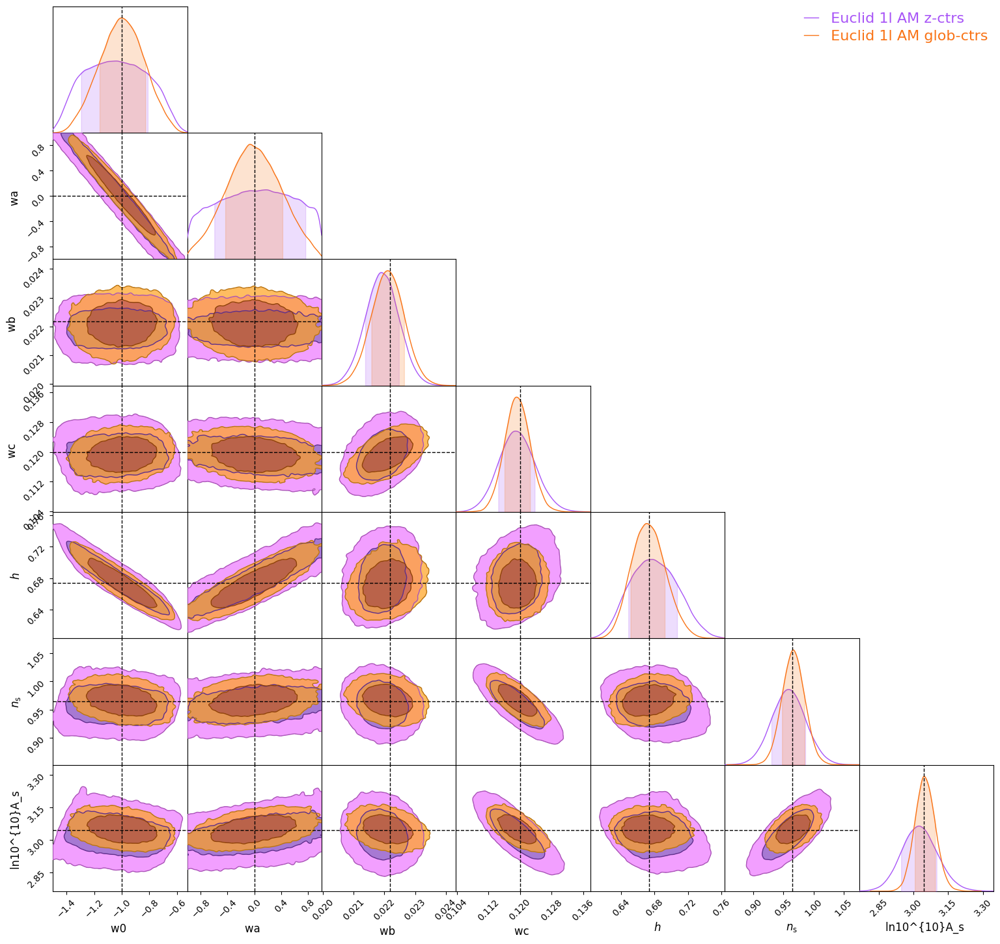

In [28]:
euclid_fig = make_triangle_plot(
    chains=[euclid_1Loop_AM_chains, euclid_AMglob_chains],
    colors=['purple', 'orange'],
    chain_labels=['Euclid 1l AM z-ctrs', 'Euclid 1l AM glob-ctrs'],
    truth_values=euclid_1Loop_AM_chains.attrs['truth_values'],
    params=euclid_1Loop_AM_chains.attrs['params'][0:7]
)

In [29]:
euclid_1Loop_AM_chains.attrs['params'][0:11]

['w0', 'wa', 'wb', 'wc', 'h', 'ns', 'ln10^{10}A_s', 'b1', 'b2', 'bG2', 'btd']

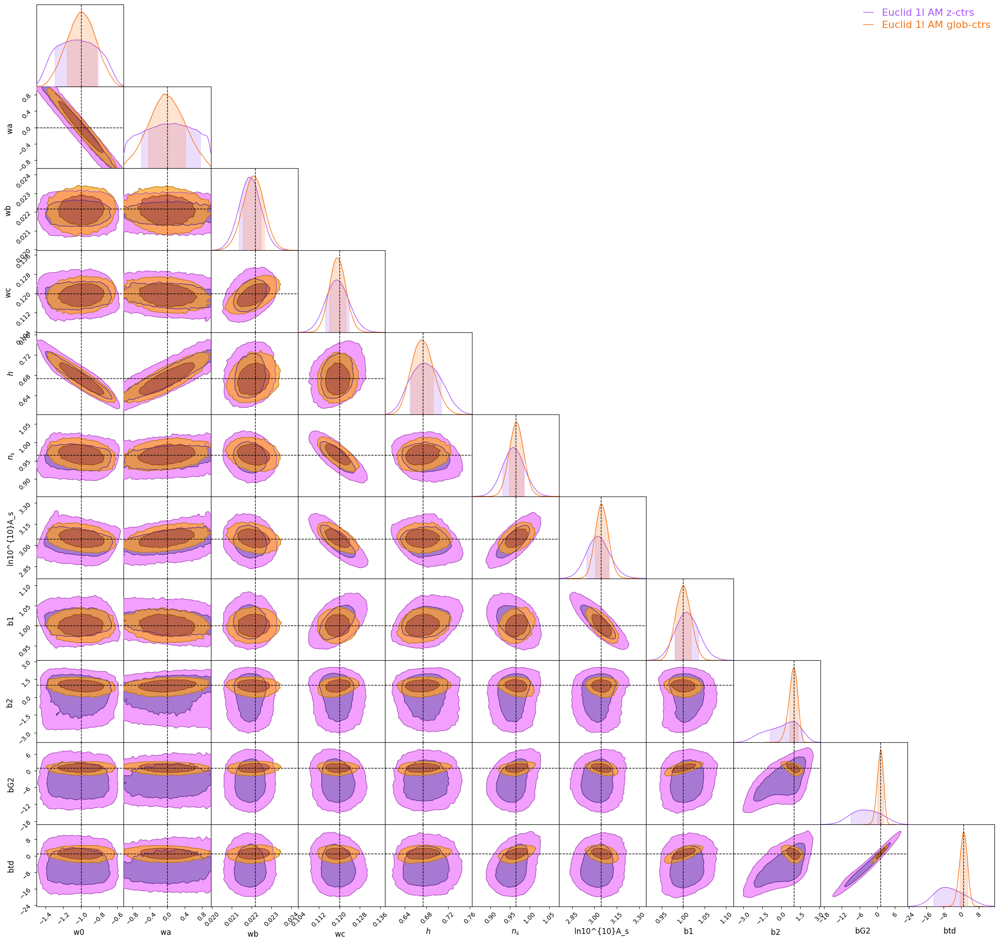

In [30]:
euclid_fig = make_triangle_plot(
    chains=[euclid_1Loop_AM_chains, euclid_AMglob_chains],
    colors=['purple', 'orange'],
    chain_labels=['Euclid 1l AM z-ctrs', 'Euclid 1l AM glob-ctrs'],
    truth_values=euclid_1Loop_AM_chains.attrs['truth_values'],
    params=euclid_1Loop_AM_chains.attrs['params'][0:11]
)

In [35]:
globbias = euclid_1Loop_AM_chains.attrs['params'][-5:-1]
globbias

['b1', 'b2', 'bG2', 'btd']

In [37]:
parstoplotbias = euclid_1Loop_AM_freebias_chains.attrs['params'][0:-1] + globbias
parstoplotbias

['w0',
 'wa',
 'wb',
 'wc',
 'h',
 'ns',
 'ln10^{10}A_s',
 'b1_1',
 'b1_2',
 'b1_3',
 'b1_4',
 'b2_1',
 'b2_2',
 'b2_3',
 'b2_4',
 'bG2_1',
 'bG2_2',
 'bG2_3',
 'bG2_4',
 'btd_1',
 'btd_2',
 'btd_3',
 'btd_4',
 'b1',
 'b2',
 'bG2',
 'btd']

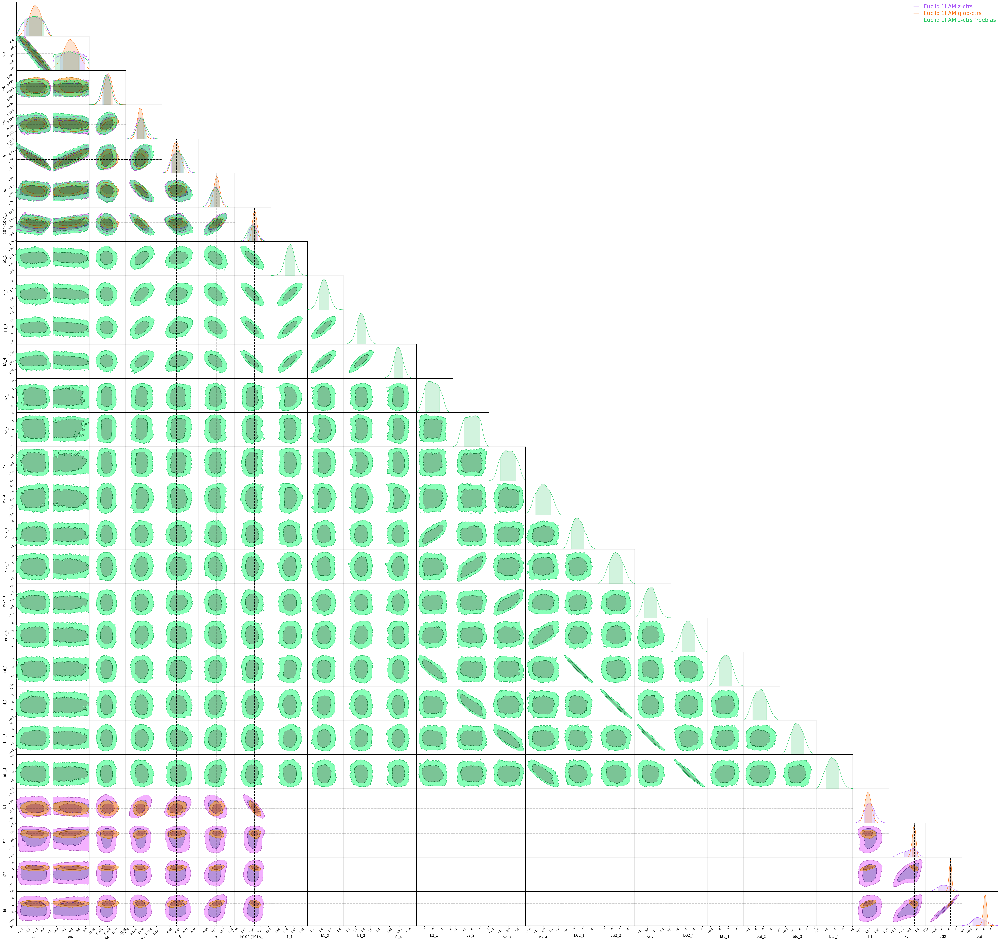

In [40]:
euclid_fig = make_triangle_plot(
    chains=[euclid_1Loop_AM_chains, euclid_AMglob_chains, euclid_1Loop_AM_freebias_chains],
    colors=['purple', 'orange', 'green', 'darkblue'],
    chain_labels=['Euclid 1l AM z-ctrs', 'Euclid 1l AM glob-ctrs', 'Euclid 1l AM z-ctrs freebias'],
    truth_values=euclid_1Loop_AM_chains.attrs['truth_values'],
    params=parstoplotbias,
    fontsize=19
)

In [41]:
eucSww_chain_path = maindir + '/Sclass_w0wa/'
eucSww_chain_root = '2024-08-24_200000_'

In [42]:

# With parameter name conversion
param_conversion = {
    'omega_cdm': 'wc',
    'omega_b': 'wb',
    'n_s': 'ns',
    'w0_fld': 'w0',
    'wa_fld': 'wa'
}

euclid_Sww_chains = load_montepython_chains(
    base_path=eucSww_chain_path,
    chain_root=eucSww_chain_root,
    num_chains=8,
    param_names_conversion_dict=param_conversion,
    derived_params={'As': ('ln10^{10}A_s', lambda x: (1e-10 * np.exp(x))*10**9)}
)

# Check the results
print("Original Parameters:", euclid_Sww_chains.attrs['original_params'])
print("Parameters:", euclid_Sww_chains.attrs['params'])
print(f"Total samples: {euclid_Sww_chains.attrs['total_samples']}")
print(f"Samples per chain: {euclid_Sww_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {euclid_Sww_chains.attrs['num_chains']}")
print(f"Columns: {euclid_Sww_chains.attrs['columns']}")
print(f"Truth values: {euclid_Sww_chains.attrs['truth_values']}")
#print("First few rows:")
#print(euclid_1Loop_AM_chains.head())

Successfully read truth values for 23 parameters
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__1.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__2.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__3.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__4.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__5.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__6.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__7.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa/2024-08-24_200000__8.txt
Added truth value for derived parameter As: 2.100549352622641
Original Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}A_s', 'P_shot0', 'P_shot1', 'P_shot2', 'P_shot3', 'lnbsigma8_0', 'lnbsigma8_1', 'lnbsigma8_2', 'lnbsigma8_3', 'sigma_v0', 'sigma_v1', 'sigma_v2', 'sigma_v3', 'sigma_p0',

In [43]:
eucSwwfixsig_chain_path = maindir + '/Sclass_w0wa_fixsig/'
eucSwwfixsig_chain_root = '2024-09-13_200000_'

In [44]:

# With parameter name conversion
param_conversion = {
    'omega_cdm': 'wc',
    'omega_b': 'wb',
    'n_s': 'ns',
    'w0_fld': 'w0',
    'wa_fld': 'wa'
}

euclid_Swwfixsig_chains = load_montepython_chains(
    base_path=eucSwwfixsig_chain_path,
    chain_root=eucSwwfixsig_chain_root,
    num_chains=8,
    param_names_conversion_dict=param_conversion,
    derived_params={'As': ('ln10^{10}A_s', lambda x: (1e-10 * np.exp(x))*10**9)}
)

# Check the results
print("Original Parameters:", euclid_Swwfixsig_chains.attrs['original_params'])
print("Parameters:", euclid_Swwfixsig_chains.attrs['params'])
print(f"Total samples: {euclid_Swwfixsig_chains.attrs['total_samples']}")
print(f"Samples per chain: {euclid_Swwfixsig_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {euclid_Swwfixsig_chains.attrs['num_chains']}")
print(f"Columns: {euclid_Swwfixsig_chains.attrs['columns']}")
print(f"Truth values: {euclid_Swwfixsig_chains.attrs['truth_values']}")
#print("First few rows:")
#print(euclid_1Loop_AM_chains.head())

Successfully read truth values for 23 parameters
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__1.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__2.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__3.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__4.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__5.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__6.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__7.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__8.txt
Added truth value for derived parameter As: 2.100549352622641
Original Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}A_s', 'P_shot0', 'P_shot1', 'P_shot2', 'P_shot3', 'lnbsigma8_0', 'lnbsigma8_1', 'lnbsigma8_2', 'lnbsigma8_3']
Par

In [45]:
eucSwwfixsig_chain_path = maindir + '/Sclass_w0wa_fixsig/'
eucSwwfixsig_chain_root = '2024-09-13_200000_'

In [46]:

# With parameter name conversion
param_conversion = {
    'omega_cdm': 'wc',
    'omega_b': 'wb',
    'n_s': 'ns',
    'w0_fld': 'w0',
    'wa_fld': 'wa'
}

euclid_Swwfixsig_chains = load_montepython_chains(
    base_path=eucSwwfixsig_chain_path,
    chain_root=eucSwwfixsig_chain_root,
    num_chains=8,
    param_names_conversion_dict=param_conversion,
    derived_params={'As': ('ln10^{10}A_s', lambda x: (1e-10 * np.exp(x))*10**9)}
)

# Check the results
print("Original Parameters:", euclid_Swwfixsig_chains.attrs['original_params'])
print("Parameters:", euclid_Swwfixsig_chains.attrs['params'])
print(f"Total samples: {euclid_Swwfixsig_chains.attrs['total_samples']}")
print(f"Samples per chain: {euclid_Swwfixsig_chains.attrs['samples_per_chain']}")
print(f"Number of chains: {euclid_Swwfixsig_chains.attrs['num_chains']}")
print(f"Columns: {euclid_Swwfixsig_chains.attrs['columns']}")
print(f"Truth values: {euclid_Swwfixsig_chains.attrs['truth_values']}")
#print("First few rows:")
#print(euclid_1Loop_AM_chains.head())

Successfully read truth values for 23 parameters
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__1.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__2.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__3.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__4.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__5.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__6.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__7.txt
Loading chain from ./oneloopchains_yesBBN/Sclass_w0wa_fixsig/2024-09-13_200000__8.txt
Added truth value for derived parameter As: 2.100549352622641
Original Parameters: ['w0_fld', 'wa_fld', 'omega_b', 'omega_cdm', 'h', 'n_s', 'ln10^{10}A_s', 'P_shot0', 'P_shot1', 'P_shot2', 'P_shot3', 'lnbsigma8_0', 'lnbsigma8_1', 'lnbsigma8_2', 'lnbsigma8_3']
Par

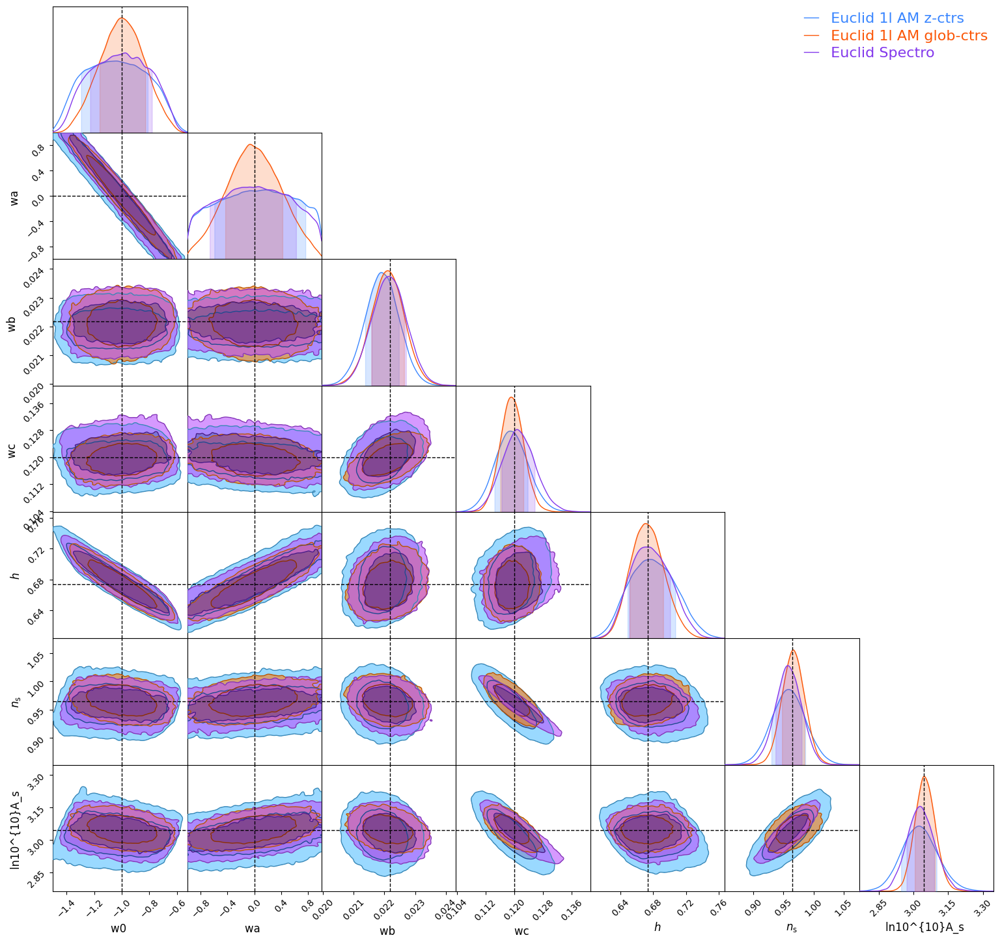

In [47]:
compare_euc_MP = make_triangle_plot(
    chains=[euclid_1Loop_AM_chains, euclid_AMglob_chains, euclid_Sww_chains],
    chain_labels=['Euclid 1l AM z-ctrs', 'Euclid 1l AM glob-ctrs', 'Euclid Spectro'],
    truth_values=euclid_Sww_chains.attrs['truth_values'],
    params=euclid_Sww_chains.attrs['params'][0:7]
)

In [51]:
parstoplotbias = euclid_1Loop_AM_freebias_chains.attrs['params'][0:-1]
parstoplotbias.pop(6)
parstoplotbias = ['As'] + parstoplotbias
parstoplotbias

['As',
 'w0',
 'wa',
 'wb',
 'wc',
 'h',
 'ns',
 'b1_1',
 'b1_2',
 'b1_3',
 'b1_4',
 'b2_1',
 'b2_2',
 'b2_3',
 'b2_4',
 'bG2_1',
 'bG2_2',
 'bG2_3',
 'bG2_4',
 'btd_1',
 'btd_2',
 'btd_3',
 'btd_4']

In [52]:
pbj_truth_values

{'wc': 0.121203,
 'wb': 0.0219961,
 'ns': 0.96,
 'h': 0.67,
 'As': 2.1,
 'w0': -1.0,
 'wa': 0.0,
 'b1_1': 1.412,
 'b1_2': 1.769,
 'b1_3': 2.039,
 'b1_4': 2.496,
 'b2_1': 0.695,
 'b2_2': 0.87,
 'b2_3': 1.162,
 'b2_4': 2.01,
 'bG2_1': -0.156,
 'bG2_2': -0.299,
 'bG2_3': -0.4,
 'bG2_4': -0.555,
 'bGam3_1': 0.323,
 'bGam3_2': 0.621,
 'bGam3_3': 0.827,
 'bGam3_4': 1.137,
 'c0t_1': 11.602875,
 'c0t_2': 14.474875,
 'c0t_3': 15.666125,
 'c0t_4': 26.412625,
 'c2t_1': 36.00720140613579,
 'c2t_2': 44.93550196893367,
 'c2t_3': 43.83654751052021,
 'c2t_4': 62.36900114288655,
 'c4t_1': 56.99922799639749,
 'c4t_2': 55.48431905786876,
 'c4t_3': 44.23950597601624,
 'c4t_4': 42.91138298234529,
 'cnlo_1': 0.0,
 'cnlo_2': 0.0,
 'cnlo_3': 0.0,
 'cnlo_4': 0.0,
 'NP0_1': 1.056,
 'NP0_2': 1.152,
 'NP0_3': 1.144,
 'NP0_4': 1.309,
 'eps0_1': 0.0,
 'eps0_2': 0.0,
 'eps0_3': 0.0,
 'eps0_4': 0.0,
 'eps2_1': 0.0,
 'eps2_2': 0.0,
 'eps2_3': 0.0,
 'eps2_4': 0.0}

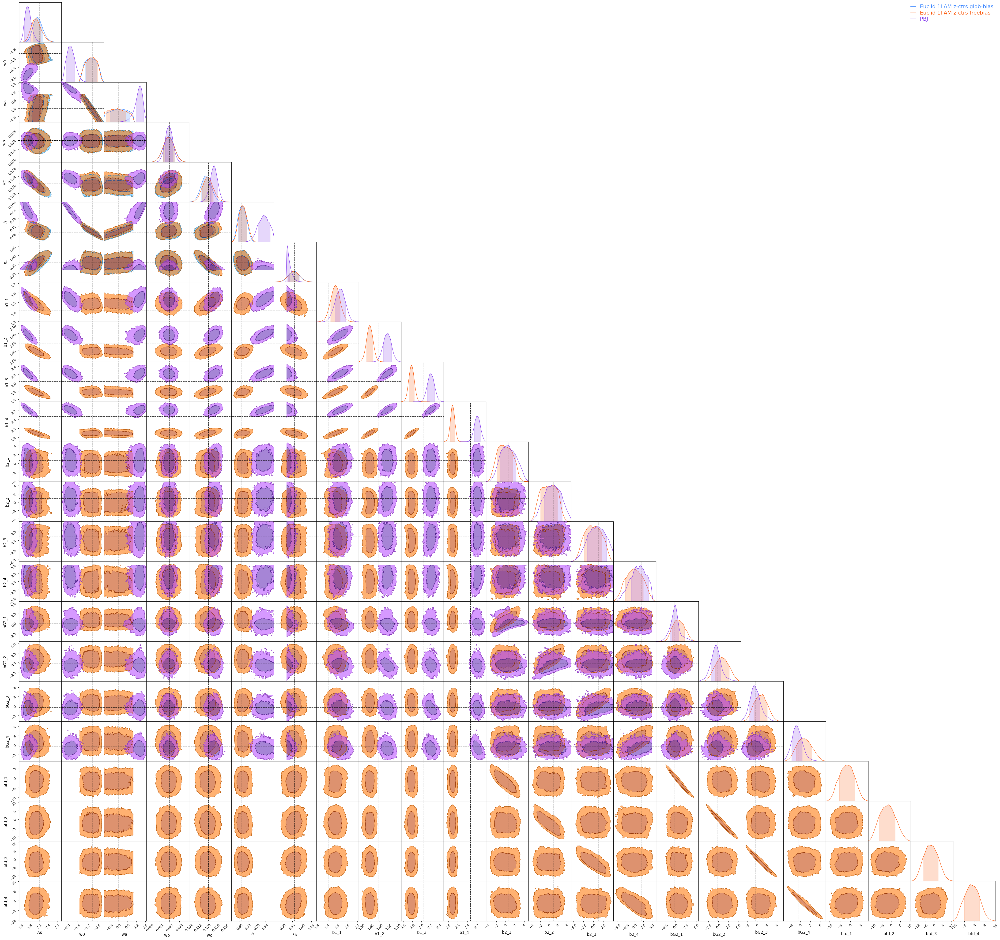

In [53]:
compare_euc_MP_PBJ = make_triangle_plot(
    chains=[euclid_1Loop_AM_chains, euclid_1Loop_AM_freebias_chains, pbj_df],
    chain_labels=['Euclid 1l AM z-ctrs glob-bias', 'Euclid 1l AM z-ctrs freebias', 'PBJ'],
    truth_values=pbj_truth_values,
    params=parstoplotbias
)